<a href="https://colab.research.google.com/github/DmsAnhr/PCVK_Ganjil_2023/blob/main/TA_PCVK_OCR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Library

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [15]:
import tensorflow as tf
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.datasets import mnist
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.callbacks import ModelCheckpoint

# Load Dataset

##Load MNIST

In [7]:
(train_data, train_labels), (test_data, test_labels) = mnist.load_data()

In [8]:
digits_data = np.vstack([train_data, test_data])
digits_labels = np.hstack([train_labels, test_labels])

## Load Kaggle A-Z

In [9]:
dataset_path = '/content/drive/MyDrive/TA_PCVK/dataset/A_Z Handwritten Data.csv'
dataset_az = pd.read_csv(dataset_path).astype('float32')
dataset_az

,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,0.639,0.640,0.641,0.642,0.643,0.644,0.645,0.646,0.647,0.648
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372445,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372446,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372447,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372448,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
# Get pixel data only
alphabet_data = dataset_az.drop('0', axis=1)

# Get labels only
alphabet_labels = dataset_az['0']

# Reshape pixel data to 28*28
alphabet_data = np.reshape(alphabet_data.values, (alphabet_data.shape[0], 28, 28))

## Combine Dataset

In [12]:
# Combine both of them
alphabet_labels += 10
data = np.vstack([alphabet_data, digits_data])
labels = np.hstack([alphabet_labels, digits_labels])
# Convert data to float32
data = np.array(data, dtype = 'float32')

data = np.expand_dims(data, axis=-1)

# Pre Training

In [13]:
# Normalize data
data = data / 255.0

# Enconde the labels
le = LabelBinarizer()
labels = le.fit_transform(labels)

classes_total = labels.sum(axis = 0)

classes_weights = {}
for i in range(0, len(classes_total)):
  classes_weights[i] = classes_total.max() / classes_total[i]

# Split Data (Train and Test)

In [18]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size = 0.2, random_state = 1, stratify = labels)

In [17]:
# Create augmentation
augmentation = ImageDataGenerator(rotation_range = 10, zoom_range=0.05, width_shift_range=0.1,
                                  height_shift_range=0.1, horizontal_flip = False)

# CNN Model

In [19]:
# Build the model
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size=(3,3), activation='relu', input_shape=(28,28,1)))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Conv2D(filters = 64, kernel_size=(3,3), activation='relu', padding='same'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Conv2D(filters = 128, kernel_size=(3,3), activation='relu', padding='valid'))
model.add(MaxPool2D(pool_size=(2,2)))

model.add(Flatten())

model.add(Dense(64, activation = 'relu'))
model.add(Dense(128, activation = 'relu'))

# output
model.add(Dense(36, activation='softmax'))

model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [20]:
# Create labels
name_labels = '0123456789'
name_labels += 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
name_labels = [l for l in name_labels]

In [21]:
import joblib

joblib.dump(name_labels, "labels.pkl")

['labels.pkl']

## Trainning model

In [ ]:
file_model = 'custom_ocr.model'
epochs = 20
batch_size = 128

checkpointer = ModelCheckpoint(file_model, monitor = 'val_loss', verbose = 1, save_best_only=True)

history = model.fit(augmentation.flow(X_train, y_train, batch_size=batch_size),
                      validation_data = (X_test, y_test),
                      steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
                      class_weight = classes_weights, verbose=1, callbacks=[checkpointer])

Epoch 1/20
2764/2765 [============================>.] - ETA: 0s - loss: 2.2178 - accuracy: 0.8242
Epoch 1: val_loss improved from inf to 0.27928, saving model to custom_ocr.model
2765/2765 [==============================] - 134s 44ms/step - loss: 2.2175 - accuracy: 0.8242 - val_loss: 0.2793 - val_accuracy: 0.8893
Epoch 2/20
2765/2765 [==============================] - ETA: 0s - loss: 1.0053 - accuracy: 0.9005
Epoch 2: val_loss improved from 0.27928 to 0.21140, saving model to custom_ocr.model
2765/2765 [==============================] - 123s 44ms/step - loss: 1.0053 - accuracy: 0.9005 - val_loss: 0.2114 - val_accuracy: 0.9194
Epoch 3/20
2764/2765 [============================>.] - ETA: 0s - loss: 0.8267 - accuracy: 0.9129
Epoch 3: val_loss did not improve from 0.21140
2765/2765 [==============================] - 114s 41ms/step - loss: 0.8264 - accuracy: 0.9129 - val_loss: 0.2325 - val_accuracy: 0.9048
Epoch 4/20
2765/2765 [==============================] - ETA: 0s - loss: 0.7366 - accu

## Save Model

In [28]:
model.save('/content/drive/MyDrive/TA_PCVK/dataset/model.keras')

# TEST

In [ ]:
model = load_model('/content/drive/MyDrive/TA_PCVK/dataset/model.keras')

##Pre-Processing Image

In [428]:
import imutils
from imutils.contours import sort_contours
import cv2

def global_thresholding(image, threshold):
    binary = np.zeros_like(image)
    binary[image > threshold] = 255
    return binary

img = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_1 - ALYA MARLIZA KOESNANTO.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (3,3), 0)
adaptive = global_thresholding(blur, 100)
invertion = 255 - adaptive
dilation = cv2.dilate(invertion, np.ones((3,3)))

# cv2_imshow(dilation)

In [408]:
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

conts = find_contours(dilation.copy())

In [416]:
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = img.copy()

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  roi = gray[y:y+h, x:x+w]
  thresh = global_thresholding(roi, 90)

  cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = img.copy()

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c)
  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    roi = gray[y:y+h, x:x+w]
    thresh = global_thresholding(roi, 90)

    cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

In [417]:
def extract_roi(img):
  roi = img[y:y+h, x:x+w]

  return roi

def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)
  (h, w) = resized.shape

  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

def normalization(img):
  img = img.astype('float32') / 255.0
  img = np.expand_dims(img, axis=-1)
  return img

def process_box(gray, x, y, w, h):

  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)
  # cv2_imshow(resized)
  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [418]:
detected_char = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 10, 160
  min_h, max_h = 14, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(gray, x, y, w, h))

In [419]:
pixels = np.array([px[0] for px in detected_char], dtype='float32')

boxes = [box[1] for box in detected_char]

In [429]:
char_list = '0123456789ABCDEFGHIJKLMNOPQRSTUVWZYZ'
char_list = [ch for ch in char_list]

4/4 [==============================] - 0s 3ms/step


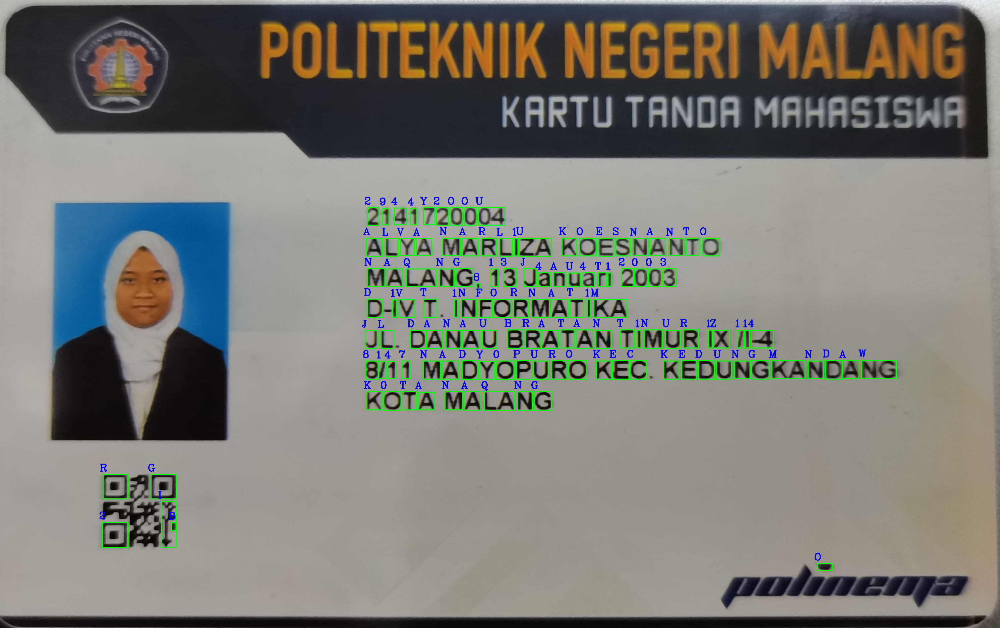

In [430]:
preds = model.predict(pixels)
for p in preds:
  char_idx = np.argmax(p)

img_copy2 = img.copy()

for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (0,255,0), 2)
  cv2.putText(img_copy2, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (255,0,0), 2)

cv2_imshow(img_copy2)

# Implementation

## Pengenalan Karakter (3 gambar)



4/4 [==============================] - 0s 3ms/step


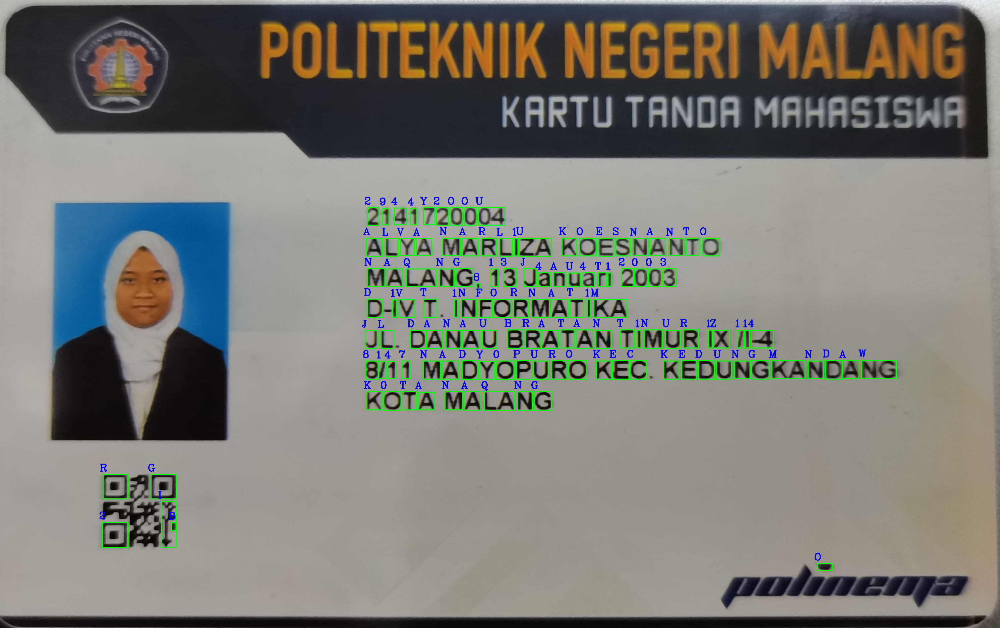

4/4 [==============================] - 0s 4ms/step


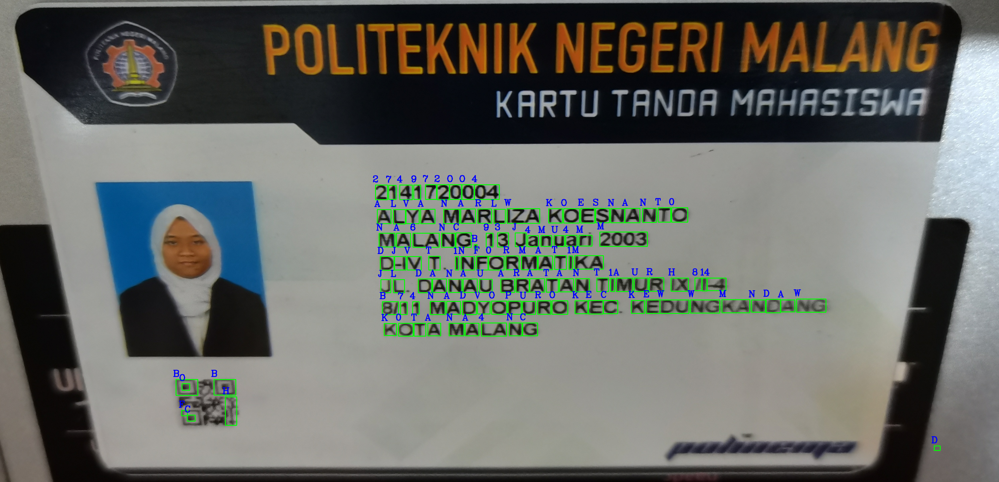

5/5 [==============================] - 0s 9ms/step


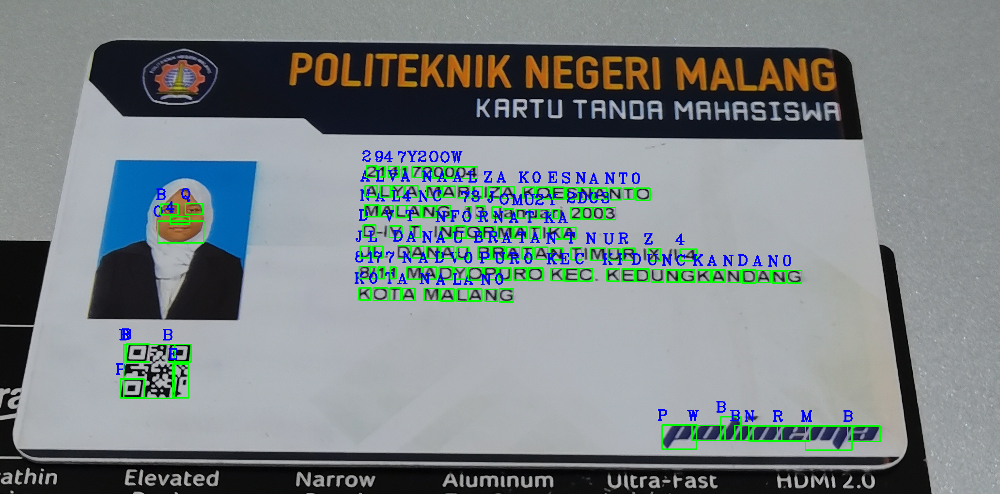

In [437]:
import imutils
from imutils.contours import sort_contours
import cv2
import numpy as np

def global_thresholding(image, threshold):
    binary = np.zeros_like(image)
    binary[image > threshold] = 255
    return binary

def extract_roi(img, x, y, w, h):
    roi = img[y:y+h, x:x+w]
    return roi

def thresholding(img):
    thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    return thresh

def resize_img(img, w, h):
    if w > h:
        resized = imutils.resize(img, width=28)
    else:
        resized = imutils.resize(img, height=28)
    (h, w) = resized.shape

    dX = int(max(0, 28 - w) / 2.0)
    dY = int(max(0, 28 - h) / 2.0)

    filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))
    filled = cv2.resize(filled, (28, 28))

    return filled

def normalization(img):
    img = img.astype('float32') / 255.0
    img = np.expand_dims(img, axis=-1)
    return img

def process_box(gray, x, y, w, h):
    roi = extract_roi(gray, x, y, w, h)
    thresh = thresholding(roi)
    (h, w) = thresh.shape
    resized = resize_img(thresh, w, h)
    normalized = normalization(resized)
    return (normalized, (x, y, w, h))

def detect_and_process(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (3,3), 0)
    adaptive = global_thresholding(blur, 100)
    invertion = 255 - adaptive
    dilation = cv2.dilate(invertion, np.ones((3,3)))

    conts = find_contours(dilation.copy())

    min_w, max_w = 10, 160
    min_h, max_h = 14, 140
    img_copy = img.copy()

    detected_char = []

    for c in conts:
        (x, y, w, h) = cv2.boundingRect(c)

        if (w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
            detected_char.append(process_box(gray, x, y, w, h))

    pixels = np.array([px[0] for px in detected_char], dtype='float32')
    boxes = [box[1] for box in detected_char]

    digits = '0123456789'
    letters = 'ABCDEFGHIJKLMNOPQRSTUVWZYZ'
    char_list = digits + letters
    char_list = [ch for ch in char_list]

    preds = model.predict(pixels)

    for (pred, (x, y, w, h)) in zip(preds, boxes):
        i = np.argmax(pred)
        char_detected = char_list[i]

        cv2.rectangle(img_copy, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.putText(img_copy, char_detected, (x - 10, y - 10), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 0, 0), 2)

    cv2_imshow(img_copy)

# Membaca tiga gambar
gambar1 = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_1 - ALYA MARLIZA KOESNANTO.jpg')
gambar2 = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_2 - ALYA MARLIZA KOESNANTO.jpg')
gambar3 = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_3 - ALYA MARLIZA KOESNANTO.jpg')

# Memproses dan menampilkan setiap gambar
detect_and_process(gambar1)
detect_and_process(gambar2)
detect_and_process(gambar3)

cv2.waitKey(0)
cv2.destroyAllWindows()


## Deteksi Wajah (3 Gambar)

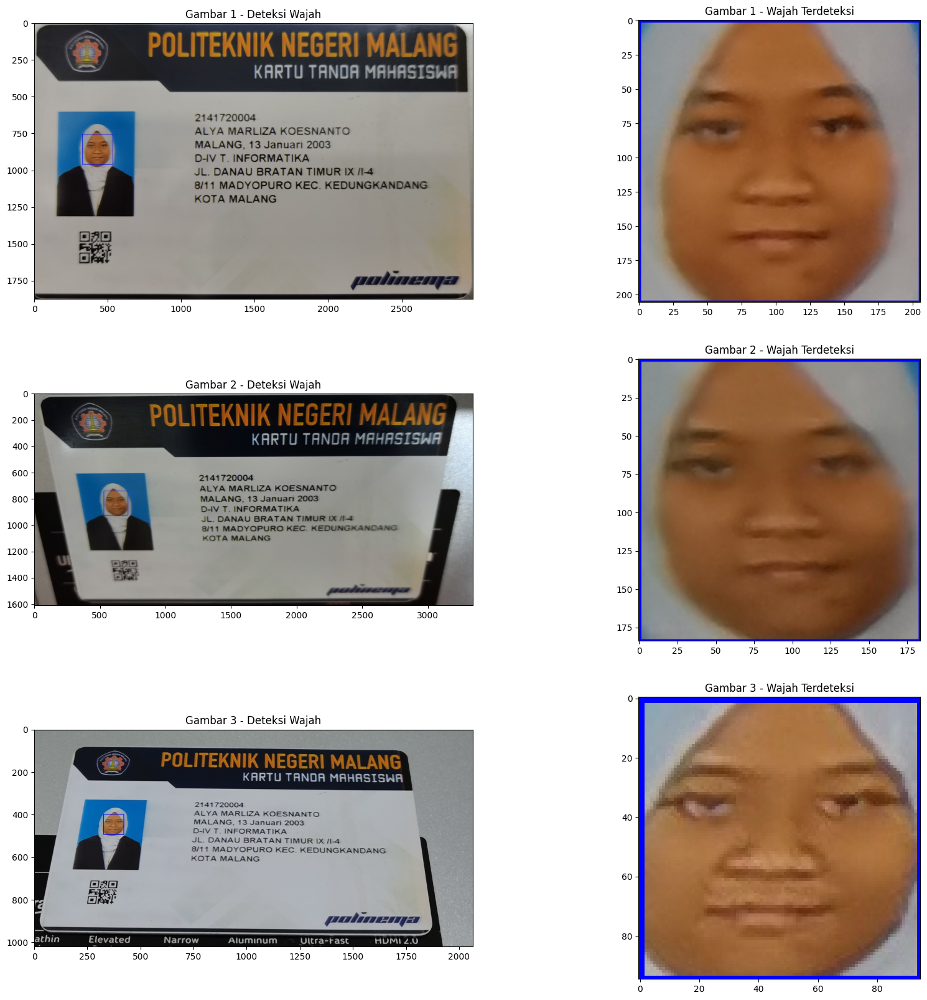

In [438]:
import cv2
import matplotlib.pyplot as plt

# Load cascade classifier
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/PCVK/haarcascades/haarcascade_frontalface_alt.xml')

def detect_and_display_faces(img):
    # Konversi ke skala abu-abu
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Mendeteksi wajah pada gambar
    wajah = cascade_wajah.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    for (x, y, w, h) in wajah:
        cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
        # Crop area
        wajah_crop = img[y:y+h, x:x+w]

    return img, wajah_crop

# Membaca tiga gambar
gambar1 = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_1 - ALYA MARLIZA KOESNANTO.jpg')
gambar2 = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_2 - ALYA MARLIZA KOESNANTO.jpg')
gambar3 = cv2.imread('/content/drive/MyDrive/TA_PCVK/3E_2141720004_3 - ALYA MARLIZA KOESNANTO.jpg')

# Memproses dan menampilkan hasil deteksi wajah untuk setiap gambar
hasil1, crop1 = detect_and_display_faces(gambar1)
hasil2, crop2 = detect_and_display_faces(gambar2)
hasil3, crop3 = detect_and_display_faces(gambar3)

# Menampilkan hasil deteksi wajah untuk setiap gambar
fig, axs = plt.subplots(3, 2, figsize=(20, 20))

axs[0, 0].imshow(cv2.cvtColor(hasil1, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title('Gambar 1 - Deteksi Wajah')

axs[0, 1].imshow(cv2.cvtColor(crop1, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title('Gambar 1 - Wajah Terdeteksi')

axs[1, 0].imshow(cv2.cvtColor(hasil2, cv2.COLOR_BGR2RGB))
axs[1, 0].set_title('Gambar 2 - Deteksi Wajah')

axs[1, 1].imshow(cv2.cvtColor(crop2, cv2.COLOR_BGR2RGB))
axs[1, 1].set_title('Gambar 2 - Wajah Terdeteksi')

axs[2, 0].imshow(cv2.cvtColor(hasil3, cv2.COLOR_BGR2RGB))
axs[2, 0].set_title('Gambar 3 - Deteksi Wajah')

axs[2, 1].imshow(cv2.cvtColor(crop3, cv2.COLOR_BGR2RGB))
axs[2, 1].set_title('Gambar 3 - Wajah Terdeteksi')

plt.show()
